#  Wprowadzenie do Digital Pathology i analizy WSI
## Tutorial: od obrazu do gotowego patcha histologicznego



---

### Spis treści
1. [Czym jest obraz histologiczny?](#1)
2. [Podstawy image processing — PIL i OpenCV](#2)
3. [Format WSI i biblioteka OpenSlide](#3)
4. [Tissue detection — gdzie jest tkanka?](#4)
5. [Patchowanie WSI](#5)
6. [Preprocessing patchy — normalizacja barwienia](#6)
7. [Zapis i organizacja datasetu](#7)
8. [Ćwiczenia](#8)


---
<a id="1"></a>
## 1. Czym jest obraz histologiczny?

Tkanka pobrana z pacjenta (np. biopsja szpiku kostnego) jest:
1. **Utrwalana** (formalina) i **zatapiana w parafinie** (FFPE)
2. **Krojona** na plastry ~4 µm
3. **Barwiona** — najczęściej **H&E** (hematoksylina + eozyna):
   - 💜 **Hematoksylina** → jądra komórkowe (niebieskofioletowa)
   - 🩷 **Eozyna** → cytoplazma, macierz zewnątrzkomórkowa (różowa)
4. **Skanowana** cyfrowo → plik WSI

### Czym różni się WSI od zwykłego zdjęcia?

| | Zwykłe zdjęcie | WSI |
|---|---|---|
| Rozmiar | 1–20 MB | 0.5–5 **GB** |
| Rozdzielczość | kilka megapikseli | **100 000 × 100 000** px i więcej |
| Format | JPEG, PNG | SVS, NDPI, MRXS, SCN, TIF |
| Ładowanie | `PIL.open()` | wymaga OpenSlide |
| Struktura | płaska | **piramida rozdzielczości** |

### Piramida rozdzielczości (multi-resolution pyramid)

```
Level 0 (40x):  100 000 × 80 000 px  ← pełna rozdzielczość
Level 1 (20x):   50 000 × 40 000 px
Level 2 (10x):   25 000 × 20 000 px
Level 3  (5x):   12 500 × 10 000 px  ← thumbnail/podgląd
```

W praktyce nigdy nie ładujemy całego Level 0 do pamięci — zamiast tego **wycinamy małe fragmenty (patche)**.


---
<a id="2"></a>
## 2. Podstawy image processing — PIL i OpenCV

Zacznijmy od tego, jak Python rozumie obraz.


In [1]:
# Instalacja
#!pip install Pillow opencv-python-headless matplotlib numpy scikit-image openslide-python


In [25]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [30]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
import cv2
import kagglehub as kg
from torch.utils.data import Dataset

In [3]:
#pobranie data setu
path = kg.dataset_download("kmader/colorectal-histology-mnist")

In [4]:
path


'/home/oligus/.cache/kagglehub/datasets/kmader/colorectal-histology-mnist/versions/2'

In [5]:
DATA_DIR = Path("/home/oligus/.cache/kagglehub/datasets/kmader/colorectal-histology-mnist/versions/2/Kather_texture_2016_image_tiles_5000/Kather_texture_2016_image_tiles_5000")

In [6]:
#wystąpiły problemy ze ścieżką — trochę się poplątała:
print(f"Ścieżka surowa: {DATA_DIR}")
print(f"Czy istnieje: {DATA_DIR.exists()}") #sprawdza czy ścieżka istnieje
print(f"Pełna ścieżka: {DATA_DIR.absolute()}") #wyświetla pełną ścieżkę jaką widzi python podczas interpretacji

Ścieżka surowa: /home/oligus/.cache/kagglehub/datasets/kmader/colorectal-histology-mnist/versions/2/Kather_texture_2016_image_tiles_5000/Kather_texture_2016_image_tiles_5000
Czy istnieje: True
Pełna ścieżka: /home/oligus/.cache/kagglehub/datasets/kmader/colorectal-histology-mnist/versions/2/Kather_texture_2016_image_tiles_5000/Kather_texture_2016_image_tiles_5000


Klasy: ['01_TUMOR', '02_STROMA', '03_COMPLEX', '04_LYMPHO', '05_DEBRIS', '06_MUCOSA', '07_ADIPOSE', '08_EMPTY']
Liczba obrazów: {'01_TUMOR': 625, '02_STROMA': 625, '03_COMPLEX': 625, '04_LYMPHO': 625, '05_DEBRIS': 625, '06_MUCOSA': 625, '07_ADIPOSE': 625, '08_EMPTY': 625}
Typ danych:       uint8
Kształt (H,W,C):  (150, 150, 3)
Wartości min/max: 4 / 255
Kanały: R=111.4, G=74.4, B=125.1


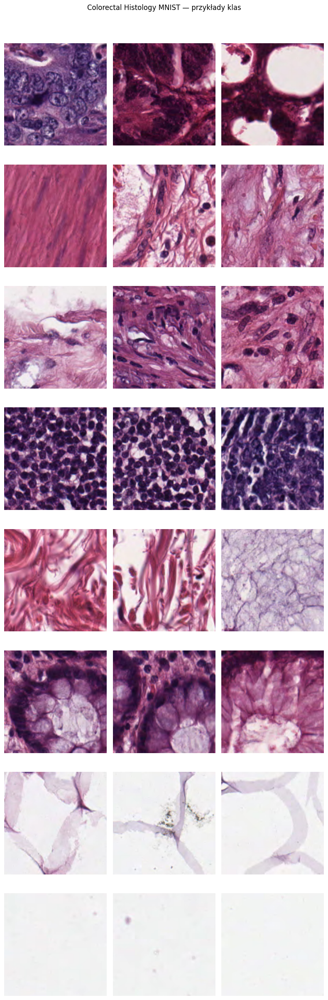

In [7]:
# ── 1. Struktura klas
class_dirs = sorted([d for d in DATA_DIR.iterdir() if d.is_dir()])
print("Klasy:", [d.name for d in class_dirs])
print("Liczba obrazów:", {d.name: len(list(d.glob("*.tif"))) for d in class_dirs})

# ── 2. Wczytanie jednego patcha
sample_path = list(class_dirs[0].glob("*.tif"))[0]
patch = np.array(Image.open(sample_path)) #macierz z obrazu

print(f"Typ danych:       {patch.dtype}")
print(f"Kształt (H,W,C):  {patch.shape}")
print(f"Wartości min/max: {patch.min()} / {patch.max()}")
print(f"Kanały: R={patch[:,:,0].mean():.1f}, G={patch[:,:,1].mean():.1f}, B={patch[:,:,2].mean():.1f}")

fig, axes = plt.subplots(len(class_dirs), 3, figsize=(8, 24))
for i, cls_dir in enumerate(class_dirs):
    samples = list(cls_dir.glob("*.tif"))[:3]
    for j, path in enumerate(samples):
        img = np.array(Image.open(path))
        axes[i, j].imshow(img)
        axes[i, j].axis("off")
        if j == 0:
            axes[i, j].set_ylabel(cls_dir.name, fontsize=10, rotation=0,
                                   labelpad=60, va='center')
plt.suptitle("Colorectal Histology MNIST — przykłady klas", y=1.01)
plt.tight_layout()
plt.savefig("he_classes_overview.png", dpi=150, bbox_inches="tight")
plt.show()

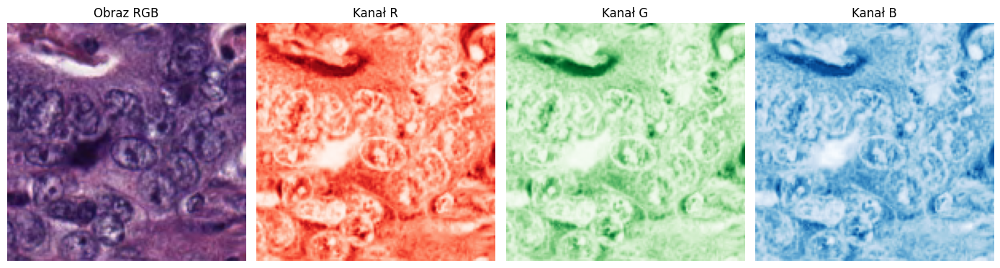

Jądra komórkowe (fioletowe) mają wysoki B, niski R. Tło (różowe) ma wysoki R.


In [8]:
# ── Obraz to tablica numpy: (wysokość, szerokość, kanały)
# Kanały: 0=R, 1=G, 2=B  (PIL/numpy)
# UWAGA: OpenCV używa BGR — pamiętaj o konwersji!

fig, axes = plt.subplots(1, 4, figsize=(14, 4))

axes[0].imshow(patch)
axes[0].set_title("Obraz RGB")
axes[0].axis("off")

for i, (name, cmap) in enumerate(zip(["Kanał R", "Kanał G", "Kanał B"],
                                      ["Reds", "Greens", "Blues"])):
    axes[i+1].imshow(patch[:, :, i], cmap=cmap)
    axes[i+1].set_title(name)
    axes[i+1].axis("off")

plt.tight_layout()
plt.show()
print("Jądra komórkowe (fioletowe) mają wysoki B, niski R. Tło (różowe) ma wysoki R.")


In [9]:
# ── PIL vs numpy vs OpenCV — trzy sposoby pracy z obrazem

# 1. PIL Image
pil_img = Image.fromarray(patch)
print(f"PIL: tryb={pil_img.mode}, rozmiar={pil_img.size}")  # size = (W, H) !

# 2. numpy array (najczęściej używane w ML)
np_img = np.array(pil_img)
print(f"numpy: shape={np_img.shape}, dtype={np_img.dtype}")  # shape = (H, W, C)

# 3. OpenCV — UWAGA: BGR, nie RGB!
cv_img = cv2.cvtColor(patch, cv2.COLOR_RGB2BGR)
print(f"OpenCV BGR: shape={cv_img.shape}")

# Konwersja z powrotem: BGR → RGB
cv_back = cv2.cvtColor(cv_img, cv2.COLOR_BGR2RGB)
print(f"Konwersja z powrotem poprawna: {np.array_equal(patch, cv_back)}")

print("""
Częsty błąd: wczytanie przez OpenCV (BGR) i wyświetlenie przez matplotlib (RGB) kolory są odwrócone. Zawsze konwertuj: cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
""")


PIL: tryb=RGB, rozmiar=(150, 150)
numpy: shape=(150, 150, 3), dtype=uint8
OpenCV BGR: shape=(150, 150, 3)
Konwersja z powrotem poprawna: True

Częsty błąd: wczytanie przez OpenCV (BGR) i wyświetlenie przez matplotlib (RGB) kolory są odwrócone. Zawsze konwertuj: cv2.cvtColor(img, cv2.COLOR_BGR2RGB)



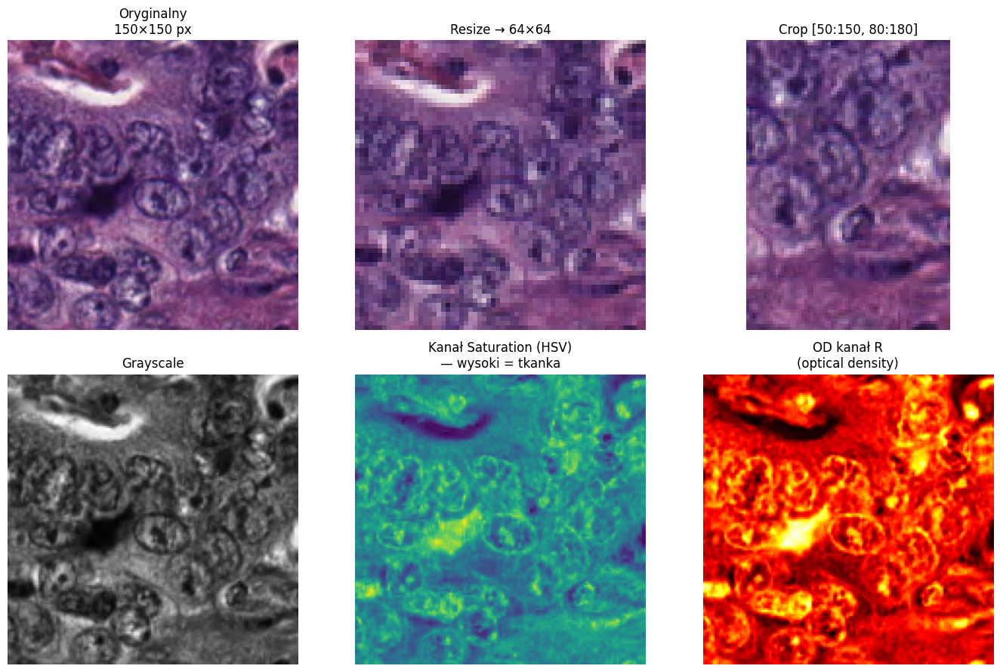

In [10]:
# ── Podstawowe operacje — resize, crop, convert to grayscale

fig, axes = plt.subplots(2, 3, figsize=(14, 9))

# Oryginalny
axes[0,0].imshow(patch)
axes[0,0].set_title(f"Oryginalny\n{patch.shape[1]}×{patch.shape[0]} px")

# Resize
small = cv2.resize(patch, (64, 64), interpolation=cv2.INTER_AREA)
axes[0,1].imshow(small)
axes[0,1].set_title("Resize → 64×64")

# Crop (numpy slicing: [y1:y2, x1:x2])
crop = patch[50:150, 80:180]
axes[0,2].imshow(crop)
axes[0,2].set_title("Crop [50:150, 80:180]")

# Grayscale
gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)
axes[1,0].imshow(gray, cmap="gray")
axes[1,0].set_title("Grayscale")

# HSV — przydatne do tissue detection
hsv = cv2.cvtColor(patch, cv2.COLOR_RGB2HSV)
axes[1,1].imshow(hsv[:,:,1], cmap="viridis")  # kanał Saturation
axes[1,1].set_title("Kanał Saturation (HSV)\n— wysoki = tkanka")

# OD (Optical Density) — używane w H&E
# OD = -log(I/I0), I0 = 255 (białe tło)
eps = 1e-6
od = -np.log((patch.astype(float) + eps) / 255.0)
axes[1,2].imshow(od[:,:,0], cmap="hot")
axes[1,2].set_title("OD kanał R\n(optical density)")

for ax in axes.flat:
    ax.axis("off")
plt.tight_layout()
plt.show()


---
<a id="3"></a>
## 3. Format WSI i biblioteka OpenSlide

### Instalacja OpenSlide

```bash
# Linux (Ubuntu/Debian)
sudo apt-get install openslide-tools
pip install openslide-python

# macOS
brew install openslide
pip install openslide-python

# Windows — wymaga pobrania binarek: https://openslide.org/download/
```

### Formaty plików WSI

| Format | Producent skanera | Rozszerzenie |
|---|---|---|
| SVS | Aperio (Leica) | `.svs` |
| NDPI | Hamamatsu | `.ndpi` |
| MRXS | 3DHISTECH | `.mrxs` + folder |
| SCN | Leica SCN | `.scn` |
| TIF/BigTIFF | różni | `.tif`, `.tiff` |

> OpenSlide obsługuje wszystkie powyższe formatem jednorodnym API.


In [11]:
class KaggleSlide:
    """
    Emuluje API OpenSlide używając prawdziwych patchy z Kaggle
    (Colorectal Histology MNIST, 150×150 px każdy).
    
    Układa patche w siatkę grid_cols × grid_rows tworząc
    "wirtualny slajd" złożony z prawdziwych obrazów H&E.
    """
    def __init__(self, data_dir, grid_cols=20, grid_rows=20, seed=42):
        data_dir = Path(data_dir)
        rng = np.random.default_rng(seed)

        # Zbierz wszystkie .tif ze wszystkich klas
        all_files = sorted(data_dir.rglob("*.tif"))
        chosen = rng.choice(all_files, size=grid_cols * grid_rows, replace=False)

        # Wczytaj i ułóż w siatkę (H_total × W_total × 3)
        PATCH = 150
        rows = []
        for r in range(grid_rows):
            row_imgs = [np.array(Image.open(chosen[r * grid_cols + c]))
                        for c in range(grid_cols)]
            rows.append(np.concatenate(row_imgs, axis=1))
        self._canvas = np.concatenate(rows, axis=0)  # (3000, 3000, 3)

        H, W = self._canvas.shape[:2]
        self.level_count = 3
        self.level_dimensions = [
            (W,      H),       # level 0 — "pełna" rozdzielczość
            (W // 2, H // 2),  # level 1
            (W // 4, H // 4),  # level 2
        ]
        self.level_downsamples = [1.0, 2.0, 4.0]
        self.properties = {
            "openslide.mpp-x": "0.50",
            "openslide.mpp-y": "0.50",
            "openslide.objective-power": "20",
        }

    def get_thumbnail(self, size):
        img = Image.fromarray(self._canvas)
        img.thumbnail(size, Image.LANCZOS)
        return img

    def read_region(self, location, level, size):
        """location = (x, y) w space level 0."""
        ds = self.level_downsamples[level]
        # Przelicz na level 0
        canvas_ds = cv2.resize(
            self._canvas,
            (self.level_dimensions[level][0], self.level_dimensions[level][1]),
            interpolation=cv2.INTER_AREA
        )
        x, y = location[0] // int(ds), location[1] // int(ds)
        w, h = size
        H, W = canvas_ds.shape[:2]
        x = min(max(x, 0), W - w)
        y = min(max(y, 0), H - h)
        region = canvas_ds[y:y+h, x:x+w]
        rgba = np.dstack([region, np.full((*region.shape[:2], 1), 255, dtype=np.uint8)])
        return Image.fromarray(rgba, mode="RGBA")

    def close(self):
        pass


slide = KaggleSlide(DATA_DIR)

print("=== KaggleSlide — właściwości ===")
print(f"Canvas (wirtualny slajd): {slide._canvas.shape[1]} × {slide._canvas.shape[0]} px")
print(f"Liczba poziomów: {slide.level_count}")
for i, (dims, ds) in enumerate(zip(slide.level_dimensions, slide.level_downsamples)):
    print(f"  Level {i}: {dims[0]:>5} × {dims[1]:>5} px  (downsample ×{ds:.0f})")
print(f"\nResolution: {slide.properties['openslide.mpp-x']} µm/px")
print(f"Objective:  {slide.properties['openslide.objective-power']}x")

=== KaggleSlide — właściwości ===
Canvas (wirtualny slajd): 3000 × 3000 px
Liczba poziomów: 3
  Level 0:  3000 ×  3000 px  (downsample ×1)
  Level 1:  1500 ×  1500 px  (downsample ×2)
  Level 2:   750 ×   750 px  (downsample ×4)

Resolution: 0.50 µm/px
Objective:  20x


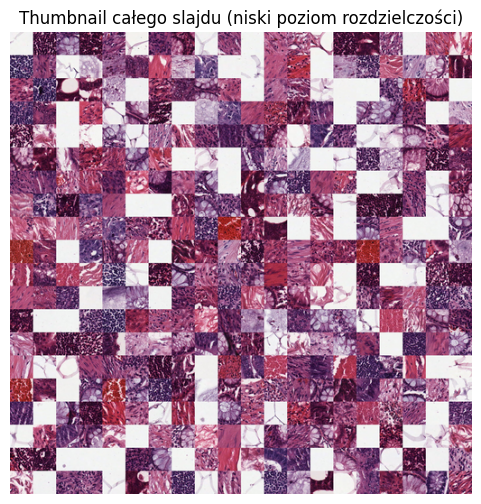

Rozmiar thumbnail: (512, 512)
Thumbnail służy do: tissue detection, QC, wizualizacji siatki patchy


In [12]:
# ── Thumbnail — podgląd całego slajdu

thumbnail = slide.get_thumbnail((512, 512))
thumbnail_np = np.array(thumbnail)

plt.figure(figsize=(6, 6))
plt.imshow(thumbnail_np)
plt.title("Thumbnail całego slajdu (niski poziom rozdzielczości)")
plt.axis("off")
plt.show()

print(f"Rozmiar thumbnail: {thumbnail.size}")
print("Thumbnail służy do: tissue detection, QC, wizualizacji siatki patchy")


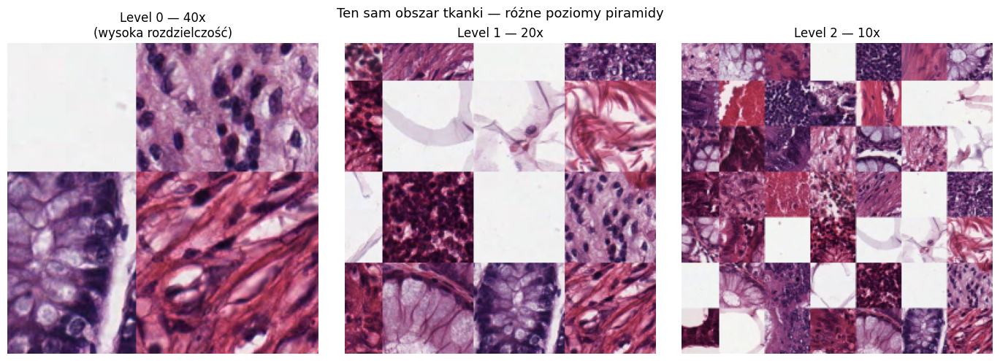


W praktyce:
   • Level 0 (40x lub 20x) → analiza szczegółów komórkowych
   • Level 1–2             → segmentacja tkanki, kontekst
   • Najniższy level       → thumbnail, QC, wizualizacja



In [13]:
# ── read_region — wycięcie fragmentu w dowolnej rozdzielczości
# Składnia: slide.read_region((x, y), level, (width, height))
# x, y — koordynaty ZAWSZE w space level 0 (pełna rozdzielczość)!

fig, axes = plt.subplots(1, 3, figsize=(14, 5))

for i, (level, title) in enumerate([(0, "Level 0 — 40x\n(wysoka rozdzielczość)"),
                                     (1, "Level 1 — 20x"),
                                     (2, "Level 2 — 10x")]):
    # Ten sam obszar anatomiczny, różne rozdzielczości
    region = slide.read_region((10000, 8000), level, (256, 256))
    region_rgb = np.array(region)[:, :, :3]  # RGBA → RGB
    axes[i].imshow(region_rgb)
    axes[i].set_title(title)
    axes[i].axis("off")

plt.suptitle("Ten sam obszar tkanki — różne poziomy piramidy", fontsize=13)
plt.tight_layout()
plt.show()

print("""
W praktyce:
   • Level 0 (40x lub 20x) → analiza szczegółów komórkowych
   • Level 1–2             → segmentacja tkanki, kontekst
   • Najniższy level       → thumbnail, QC, wizualizacja
""")


---
<a id="4"></a>
## 4. Tissue detection — gdzie jest tkanka?

Slajd to nie tylko tkanka — jest też **białe tło**, artefakty, kleje, markery.  
Przed patchowaniem trzeba znaleźć regiony zawierające tkankę.

### Metody tissue detection

| Metoda | Idea | Kiedy użyć |
|---|---|---|
| **Progowanie Otsu** | automatyczny próg szarości | H&E, szybkie |
| **Saturation (HSV)** | tkanka ma wyższe nasycenie niż tło | H&E, najlepsze domyślnie |
| **OD threshold** | optical density > próg | multi-stain |
| **Morphological ops** | fill holes, remove noise | zawsze po powyższych |


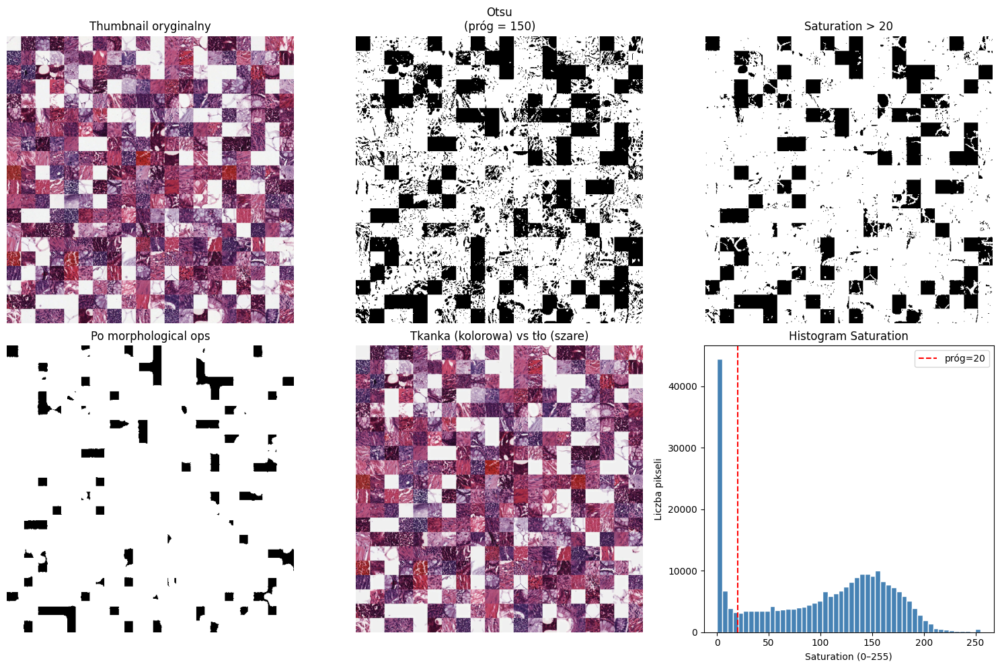

Pokrycie tkanką: 91.8% powierzchni slajdu


In [14]:
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects, binary_dilation, disk

# ── Krok 1: pobieramy thumbnail do tissue detection
thumb = np.array(slide.get_thumbnail((512, 512)))[:, :, :3]
h_thumb, w_thumb = thumb.shape[:2]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Oryginalny thumbnail
axes[0,0].imshow(thumb)
axes[0,0].set_title("Thumbnail oryginalny")
axes[0,0].axis("off")

# ── Metoda 1: Otsu na grayscale
gray = cv2.cvtColor(thumb, cv2.COLOR_RGB2GRAY)
thresh_otsu = threshold_otsu(gray)
mask_otsu = gray < thresh_otsu  # ciemniejsze = tkanka

axes[0,1].imshow(mask_otsu, cmap="gray")
axes[0,1].set_title(f"Otsu\n(próg = {thresh_otsu:.0f})")
axes[0,1].axis("off")

# ── Metoda 2: HSV Saturation (lepsza dla H&E)
hsv = cv2.cvtColor(thumb, cv2.COLOR_RGB2HSV)
saturation = hsv[:, :, 1]  # kanał S: 0–255
mask_sat = saturation > 20  # tkanka ma nasycenie > 20

axes[0,2].imshow(mask_sat, cmap="gray")
axes[0,2].set_title("Saturation > 20")
axes[0,2].axis("off")

# ── Krok 2: morphological post-processing
# Usunięcie małych obiektów (artefakty) + dylatacja (wypełnienie dziur)
mask_clean = remove_small_objects(mask_sat, min_size=500)
mask_dilated = binary_dilation(mask_clean, disk(5))

axes[1,0].imshow(mask_dilated, cmap="gray")
axes[1,0].set_title("Po morphological ops")
axes[1,0].axis("off")

# ── Finalna maska nałożona na thumbnail
overlay = thumb.copy()
overlay[~mask_dilated] = [240, 240, 240]  # tło → jasne szare
axes[1,1].imshow(overlay)
axes[1,1].set_title("Tkanka (kolorowa) vs tło (szare)")
axes[1,1].axis("off")

# ── Histogram nasycenia
axes[1,2].hist(saturation.ravel(), bins=50, color="steelblue", edgecolor="white")
axes[1,2].axvline(20, color="red", linestyle="--", label="próg=20")
axes[1,2].set_title("Histogram Saturation")
axes[1,2].set_xlabel("Saturation (0–255)")
axes[1,2].set_ylabel("Liczba pikseli")
axes[1,2].legend()

plt.tight_layout()
plt.show()

tissue_fraction = mask_dilated.mean()
print(f"Pokrycie tkanką: {tissue_fraction:.1%} powierzchni slajdu")


---
<a id="5"></a>
## 5. Patchowanie WSI

**Patch** = mały wycinek o stałym rozmiarze (np. 256×256 px), gotowy do podania do sieci neuronowej.

### Strategia patchowania

```
┌────────────────────────────────┐
│          cały slajd            │
│   ┌──┬──┬──┬──┬──┬──┬──┬──┐  │
│   │  │✓ │  │✓ │✓ │  │✓ │  │  │
│   ├──┼──┼──┼──┼──┼──┼──┼──┤  │
│   │✓ │✓ │✓ │✓ │  │✓ │✓ │✓ │  │
│   └──┴──┴──┴──┴──┴──┴──┴──┘  │
│   ✓ = tkanka, puste = tło     │
└────────────────────────────────┘
```

Parametry patchowania:
- **patch_size** — rozmiar patcha w px (np. 256)
- **level** — poziom rozdzielczości (0 = 40x, 1 = 20x...)
- **overlap** — nakładanie się patchy (0 = brak, 0.5 = 50%)
- **tissue_threshold** — minimalny % tkanki w patchu (np. 0.5)


In [15]:
print(f"Liczba levels: {slide.level_count}")
print(f"level_dimensions: {slide.level_dimensions}")
print(f"level_downsamples: {slide.level_downsamples}")

Liczba levels: 3
level_dimensions: [(3000, 3000), (1500, 1500), (750, 750)]
level_downsamples: [1.0, 2.0, 4.0]


In [16]:
def get_tissue_mask_for_patching(slide, level=2, sat_thresh=20, min_size=500):
    """
    Zwraca binarną maskę tkanki w koordynatach podanego level.
    Maska ma wymiary odpowiadające slide.level_dimensions[level].
    """
    # Pobieramy thumbnail na najniższym poziomie
    thumb_size = slide.level_dimensions[level]
    thumb = np.array(slide.get_thumbnail(thumb_size))[:, :, :3]

    hsv = cv2.cvtColor(thumb, cv2.COLOR_RGB2HSV)
    sat = hsv[:, :, 1]
    mask = sat > sat_thresh
    mask = remove_small_objects(mask, min_size=min_size)
    mask = binary_dilation(mask, disk(3))
    return mask, thumb


def compute_patch_grid(slide, patch_size=256, level=0, overlap=0.0,
                       tissue_thresh=0.5, mask_level=2):
    """
    Generuje listę koordynatów patchy pokrywających tkankę.

    Returns:
        coords: lista krotek (x_level0, y_level0) — koordynaty w space level 0
        grid_info: słownik z metadanymi
    """
    mask, _ = get_tissue_mask_for_patching(slide, level=mask_level)

    # Downsample factor między level 0 a mask_level
    ds_mask = slide.level_downsamples[mask_level]
    ds_patch = slide.level_downsamples[level]

    # Krok w px na poziomie 'level'
    step = int(patch_size * (1 - overlap))

    # Wymiary slajdu na poziomie 'level'
    W, H = slide.level_dimensions[level]

    coords = []
    n_total = 0
    n_tissue = 0

    for y in range(0, H - patch_size + 1, step):
        for x in range(0, W - patch_size + 1, step):
            n_total += 1
            # Mapujemy do maski (niski level)
            # x,y są w level 'level' → przeliczamy do level 0 → do mask
            x_mask = int(x * ds_patch / ds_mask)
            y_mask = int(y * ds_patch / ds_mask)
            pw_mask = max(1, int(patch_size * ds_patch / ds_mask))
            ph_mask = max(1, int(patch_size * ds_patch / ds_mask))

            x_mask = min(x_mask, mask.shape[1] - 1)
            y_mask = min(y_mask, mask.shape[0] - 1)
            x2m = min(x_mask + pw_mask, mask.shape[1])
            y2m = min(y_mask + ph_mask, mask.shape[0])

            region_mask = mask[y_mask:y2m, x_mask:x2m]
            if region_mask.size == 0:
                continue
            tissue_frac = region_mask.mean()

            if tissue_frac >= tissue_thresh:
                # Koordynaty w level 0
                x0 = int(x * ds_patch)
                y0 = int(y * ds_patch)
                coords.append((x0, y0))
                n_tissue += 1

    return coords, {
        "total_grid_positions": n_total,
        "tissue_patches": n_tissue,
        "tissue_fraction": n_tissue / max(n_total, 1),
        "patch_size": patch_size,
        "level": level,
    }

# ── Obliczamy siatkę patchy
# Dla demonstracji używamy level=2 (żeby szybko)
coords, info = compute_patch_grid(slide, patch_size=150, level=2,
                                   overlap=0.0, tissue_thresh=0.4)

print("=== Wyniki patchowania ===")
for k, v in info.items():
    if isinstance(v, float):
        print(f"  {k}: {v:.2%}")
    else:
        print(f"  {k}: {v}")
print(f"\nPierwsze 5 koordynatów (x0, y0) w level 0:")
for c in coords[:5]:
    print(f"  {c}")


=== Wyniki patchowania ===
  total_grid_positions: 25
  tissue_patches: 25
  tissue_fraction: 100.00%
  patch_size: 150
  level: 2

Pierwsze 5 koordynatów (x0, y0) w level 0:
  (0, 0)
  (600, 0)
  (1200, 0)
  (1800, 0)
  (2400, 0)


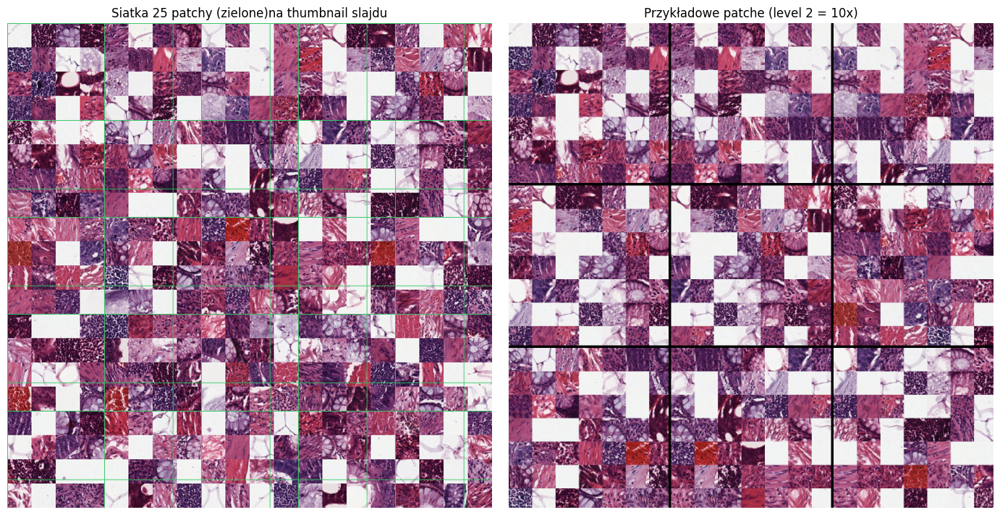

In [17]:
# ── Wizualizacja siatki patchy na thumbnail

mask, thumb = get_tissue_mask_for_patching(slide, level=2)
thumb_h, thumb_w = thumb.shape[:2]
W0, H0 = slide.level_dimensions[0]

fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Thumbnail z nałożoną siatką
img_grid = thumb.copy()
ds_thumb = slide.level_downsamples[2]
ds_patch_level = slide.level_downsamples[2]

for x0, y0 in coords[:300]:  # rysujemy max 300 patchy
    # Przelicz koordynaty level0 → thumbnail
    xt = int(x0 / W0 * thumb_w)
    yt = int(y0 / H0 * thumb_h)
    pw_t = max(2, int(256 * ds_patch_level / W0 * thumb_w))
    ph_t = max(2, int(256 * ds_patch_level / H0 * thumb_h))
    cv2.rectangle(img_grid, (xt, yt), (xt + pw_t, yt + ph_t),
                  (50, 200, 100), 1)

axes[0].imshow(img_grid)
axes[0].set_title(f"Siatka {info['tissue_patches']} patchy (zielone)na thumbnail slajdu")
axes[0].axis("off")

# Przykładowe patche
example_patches = []
for x0, y0 in coords[:9]:
    region = slide.read_region((x0, y0), 2, (256, 256))
    example_patches.append(np.array(region)[:, :, :3])

ax2 = axes[1]
ax2.axis("off")
ax2.set_title("Przykładowe patche (level 2 = 10x)")

# Siatka 3x3 patchy
grid_img = np.zeros((3*256 + 2*4, 3*256 + 2*4, 3), dtype=np.uint8)
for idx, p in enumerate(example_patches):
    row, col = idx // 3, idx % 3
    y_start = row * (256 + 4)
    x_start = col * (256 + 4)
    grid_img[y_start:y_start+256, x_start:x_start+256] = p

ax2.imshow(grid_img)

plt.tight_layout()
plt.show()

---
<a id="6"></a>
## 6. Preprocessing patchy — normalizacja barwienia

### Problem: variability barwienia H&E

Różne laboratoria / skanery / partie odczynników → różne kolory przy tej samej tkance.  
To **poważny problem** dla modeli ML — sieć trenowana na jednym ośrodku może słabo generalizować.

### Metody normalizacji

| Metoda | Idea | Złożoność |
|---|---|---|
| **Macenko** | dekompozycja OD na wektory barwień H i E | ⭐⭐ |
| **Vahadane** | sparse NMF | ⭐⭐⭐ |
| **Reinhard** | transfer statystyk w przestrzeni LAB | ⭐ (prosta) |
| **StainTools / torchstain** | biblioteki gotowe do użycia | — |

Tutaj zaimplementujemy **normalizację Macenko** — najczęstszą w literaturze.


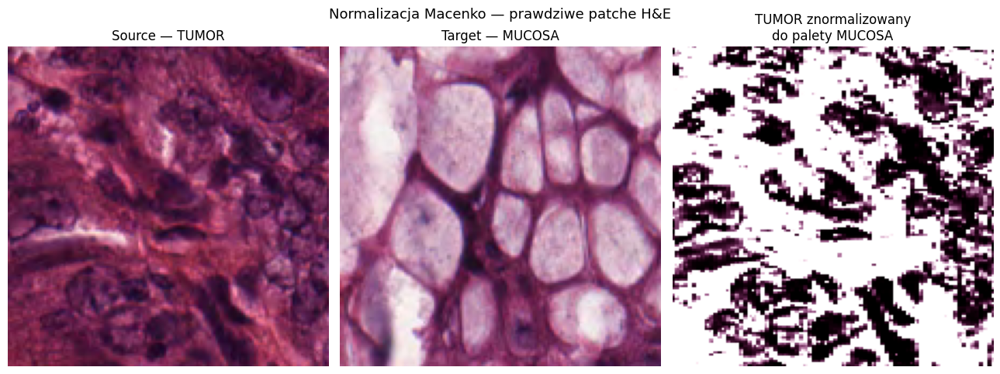

Średnia zmiana pikseli po normalizacji: 108.6 (skala 0–255)

 W prawdziwym projekcie użyj: pip install torchstain lub staintools


In [18]:
def rgb_to_od(rgb, beta=0.15):
    """RGB → Optical Density. Tło (białe) ma OD≈0, barwniki mają OD>0."""
    rgb = rgb.astype(float)
    rgb = np.clip(rgb, 1, 255)  # unikamy log(0)
    od = -np.log(rgb / 255.0)
    # Maskujemy tło (niskie OD = jasne piksele)
    mask = (od > beta).any(axis=2)
    return od, mask

def macenko_normalization(patch, target_patch, percentile=99):
    """
    Normalizacja barwienia metodą Macenko (uproszczona).

    Params:
        patch        — patch do normalizacji (H,W,3) uint8
        target_patch — referencyjny patch (H,W,3) uint8

    Returns:
        znormalizowany patch uint8
    """
    def get_stain_matrix(img):
        od, mask = rgb_to_od(img)
        od_masked = od[mask].reshape(-1, 3)
        # SVD na macierzy OD
        _, _, V = np.linalg.svd(od_masked, full_matrices=False)
        # Pierwsze dwa wektory własne = przestrzeń barwień H i E
        plane = V[:2, :]
        # Rzutowanie na płaszczyznę
        proj = od_masked @ plane.T
        # Wyznaczanie wektorów kątowych (Macenko: kąt w 1 i 99 percentylu)
        angles = np.arctan2(proj[:, 1], proj[:, 0])
        phi1 = np.percentile(angles, 1)
        phi2 = np.percentile(angles, 99)
        v1 = np.array([np.cos(phi1), np.sin(phi1)])
        v2 = np.array([np.cos(phi2), np.sin(phi2)])
        # Przypisanie: H (hematoksylina) ma zwykle wyższy kanał niebieski
        stain_matrix = np.array([v1 @ plane, v2 @ plane])
        if stain_matrix[0, 2] < stain_matrix[1, 2]:
            stain_matrix = stain_matrix[[1, 0], :]
        return stain_matrix

    def get_concentrations(img, stain_matrix):
        od, mask = rgb_to_od(img)
        od_flat = od.reshape(-1, 3)
        # Least squares: OD = C @ stain_matrix
        C, _, _, _ = np.linalg.lstsq(stain_matrix.T, od_flat.T, rcond=None)
        return C.T.reshape(img.shape[0], img.shape[1], 2)

    # Macierze barwień
    SM_source = get_stain_matrix(patch)
    SM_target = get_stain_matrix(target_patch)

    # Koncentracje barwników w source
    C = get_concentrations(patch, SM_source)

    # Skalowanie koncentracji do percentyli target
    C_flat = C.reshape(-1, 2)
    max_C_source = np.percentile(C_flat, percentile, axis=0)
    max_C_target = np.percentile(
        get_concentrations(target_patch, SM_target).reshape(-1, 2),
        percentile, axis=0
    )
    C_norm = C_flat * (max_C_target / (max_C_source + 1e-6))

    # Rekonstrukcja w OD i konwersja z powrotem do RGB
    OD_norm = C_norm @ SM_target
    OD_norm = OD_norm.reshape(patch.shape)
    rgb_norm = np.exp(-OD_norm) * 255
    rgb_norm = np.clip(rgb_norm, 0, 255).astype(np.uint8)
    return rgb_norm


# ── Generujemy dwa patche z różnym "barwieniem"
import random

def load_patch(class_name, idx=0):
    files = sorted((DATA_DIR / class_name).glob("*.tif"))
    return np.array(Image.open(files[idx]))

source_patch = load_patch("01_TUMOR",  idx=3)
target_patch = load_patch("06_MUCOSA", idx=5)

try:
    normalized = macenko_normalization(source_patch, target_patch)
    norm_ok = True
except Exception as e:
    normalized = source_patch.copy()
    norm_ok = False
    print(f"Uwaga: normalizacja nie powiodła się: {e}")

fig, axes = plt.subplots(1, 3, figsize=(13, 5))
titles = ["Source — TUMOR", "Target — MUCOSA", "TUMOR znormalizowany\ndo palety MUCOSA"]
for ax, img, title in zip(axes, [source_patch, target_patch, normalized], titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.set_xlabel(f"R={img[:,:,0].mean():.0f}  G={img[:,:,1].mean():.0f}  B={img[:,:,2].mean():.0f}",
                  fontsize=9)
    ax.axis("off")

plt.suptitle("Normalizacja Macenko — prawdziwe patche H&E", fontsize=13)
plt.tight_layout()
plt.show()

if norm_ok:
    diff = np.abs(normalized.astype(float) - target_patch.astype(float)).mean()
    print(f"Średnia zmiana pikseli po normalizacji: {diff:.1f} (skala 0–255)")
print("\n W prawdziwym projekcie użyj: pip install torchstain lub staintools")


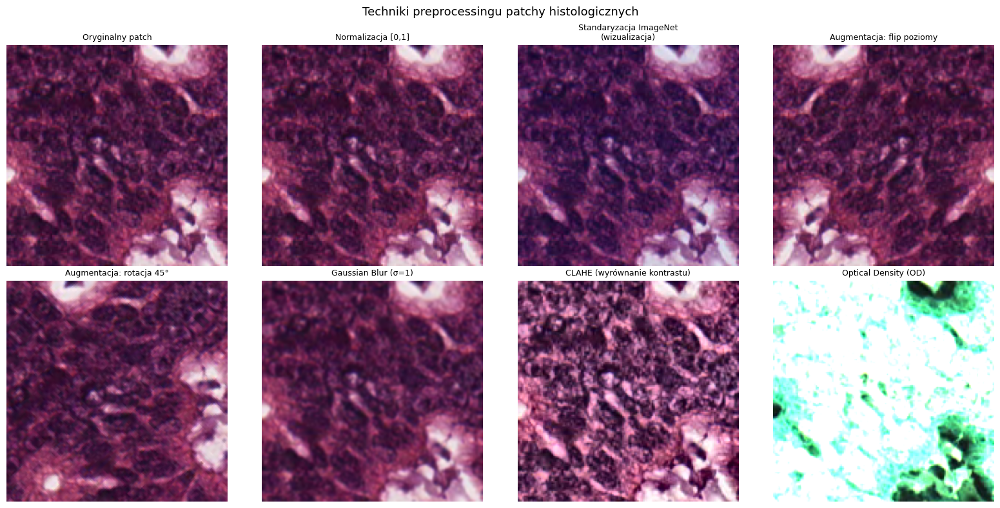

In [19]:
# ── Inne techniki preprocessing przed podaniem do modelu

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
patch_demo = load_patch("01_TUMOR", idx=5)
patch_demo = cv2.resize(patch_demo, (256, 256), interpolation=cv2.INTER_AREA)

def show(ax, img, title):
    ax.imshow(img, cmap="gray" if img.ndim == 2 else None)
    ax.set_title(title, fontsize=9)
    ax.axis("off")

show(axes[0,0], patch_demo, "Oryginalny patch")

# 1. Normalizacja do [0,1] float
normalized_01 = patch_demo.astype(float) / 255.0
show(axes[0,1], normalized_01, "Normalizacja [0,1]")

# 2. Standaryzacja ImageNet (do transferu z pretrenowanych modeli)
mean_imagenet = np.array([0.485, 0.456, 0.406])
std_imagenet  = np.array([0.229, 0.224, 0.225])
standardized = (normalized_01 - mean_imagenet) / std_imagenet
# Dla wizualizacji: przywróć do widocznego zakresu
vis_std = (standardized - standardized.min()) / (standardized.max() - standardized.min())
show(axes[0,2], vis_std, "Standaryzacja ImageNet\n(wizualizacja)")

# 3. Augmentacje (ważne w trenowaniu)
import cv2
# Horizontal flip
flipped = cv2.flip(patch_demo, 1)
show(axes[0,3], flipped, "Augmentacja: flip poziomy")

# 4. Rotacja
M = cv2.getRotationMatrix2D((128, 128), 45, 1.0)
rotated = cv2.warpAffine(patch_demo, M, (256, 256),
                          borderMode=cv2.BORDER_REFLECT)
show(axes[1,0], rotated, "Augmentacja: rotacja 45°")

# 5. Gaussian blur (desmearing)
blurred = cv2.GaussianBlur(patch_demo, (5, 5), 1.0)
show(axes[1,1], blurred, "Gaussian Blur (σ=1)")

# 6. CLAHE — kontrast lokalny
lab = cv2.cvtColor(patch_demo, cv2.COLOR_RGB2LAB)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
lab[:,:,0] = clahe.apply(lab[:,:,0])
clahe_img = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
show(axes[1,2], clahe_img, "CLAHE (wyrównanie kontrastu)")

# 7. Konwersja do przestrzeni OD
od_vis, _ = rgb_to_od(patch_demo)
od_norm = np.clip(od_vis, 0, 1)
show(axes[1,3], od_norm, "Optical Density (OD)")

plt.suptitle("Techniki preprocessingu patchy histologicznych", fontsize=13)
plt.tight_layout()
plt.show()


---
<a id="7"></a>
## 7. Zapis i organizacja datasetu

### Struktura katalogów — rekomendacja

```
dataset/
├── patches/
│   ├── patient_001/
│   │   ├── patch_00000_x12345_y67890.png
│   │   ├── patch_00001_x12601_y67890.png
│   │   └── ...
│   └── patient_002/
│       └── ...
├── metadata/
│   ├── coords.csv          ← koordynaty i metadane patchy
│   └── slide_info.csv      ← informacje o slajdach
└── masks/
    └── patient_001_tissue_mask.png
```

### Plik coords.csv

| patch_id | slide_id | x_level0 | y_level0 | level | patch_size | tissue_frac | label |
|---|---|---|---|---|---|---|---|
| 0 | patient_001 | 12345 | 67890 | 0 | 256 | 0.82 | tumor |


In [20]:
import os
import pandas as pd
from pathlib import Path

def save_patches_with_metadata(slide, coords, slide_id, output_dir,
                                patch_size=256, level=2, max_patches=20):
    """
    Wycina i zapisuje patche + generuje metadata CSV.

    Params:
        slide      — obiekt OpenSlide (lub FakeSlide)
        coords     — lista (x0, y0) w level 0
        slide_id   — identyfikator slajdu
        output_dir — katalog wyjściowy
        max_patches — limit (do demo)
    """
    out_path = Path(output_dir) / "patches" / slide_id
    out_path.mkdir(parents=True, exist_ok=True)

    records = []
    for i, (x0, y0) in enumerate(coords[:max_patches]):
        # Wycięcie patcha
        region = slide.read_region((x0, y0), level, (patch_size, patch_size))
        patch_rgb = np.array(region)[:, :, :3]

        # Sprawdzenie jakości: odrzuć prawie białe patche
        if patch_rgb.mean() > 240:
            continue

        # Zapis
        fname = f"patch_{i:05d}_x{x0}_y{y0}.png"
        fpath = out_path / fname
        Image.fromarray(patch_rgb).save(fpath)

        records.append({
            "patch_id": i,
            "slide_id": slide_id,
            "filename": str(fpath),
            "x_level0": x0,
            "y_level0": y0,
            "level": level,
            "patch_size": patch_size,
            "mean_intensity": patch_rgb.mean().round(2),
            "std_intensity": patch_rgb.std().round(2),
        })

    df = pd.DataFrame(records)
    meta_path = Path(output_dir) / "metadata"
    meta_path.mkdir(parents=True, exist_ok=True)
    df.to_csv(meta_path / f"{slide_id}_coords.csv", index=False)
    return df

# ── Demo: zapisujemy 20 patchy
import tempfile
tmp_dir = tempfile.mkdtemp()

df_meta = save_patches_with_metadata(
    slide, coords, slide_id="kaggle_colorectal",
    output_dir=tmp_dir, patch_size=150, level=0, max_patches=20
)

print("=== Metadata DataFrame ===")
print(df_meta[["patch_id", "slide_id", "x_level0", "y_level0",
               "mean_intensity", "std_intensity"]].to_string(index=False))
print(f"\nZapisano {len(df_meta)} patchy do: {tmp_dir}/patches/patient_001/")


=== Metadata DataFrame ===
 patch_id          slide_id  x_level0  y_level0  mean_intensity  std_intensity
        1 kaggle_colorectal       600         0          105.31          48.85
        2 kaggle_colorectal      1200         0          234.51          14.02
        3 kaggle_colorectal      1800         0          138.64          57.53
        4 kaggle_colorectal      2400         0          121.39          55.42
        5 kaggle_colorectal         0       600           97.30          70.35
        6 kaggle_colorectal       600       600          139.21          55.89
        7 kaggle_colorectal      1200       600           87.43          43.30
        8 kaggle_colorectal      1800       600          222.34          40.81
        9 kaggle_colorectal      2400       600          210.11          34.60
       10 kaggle_colorectal         0      1200          142.98          51.18
       11 kaggle_colorectal       600      1200          111.99          46.81
       12 kaggle_colorect

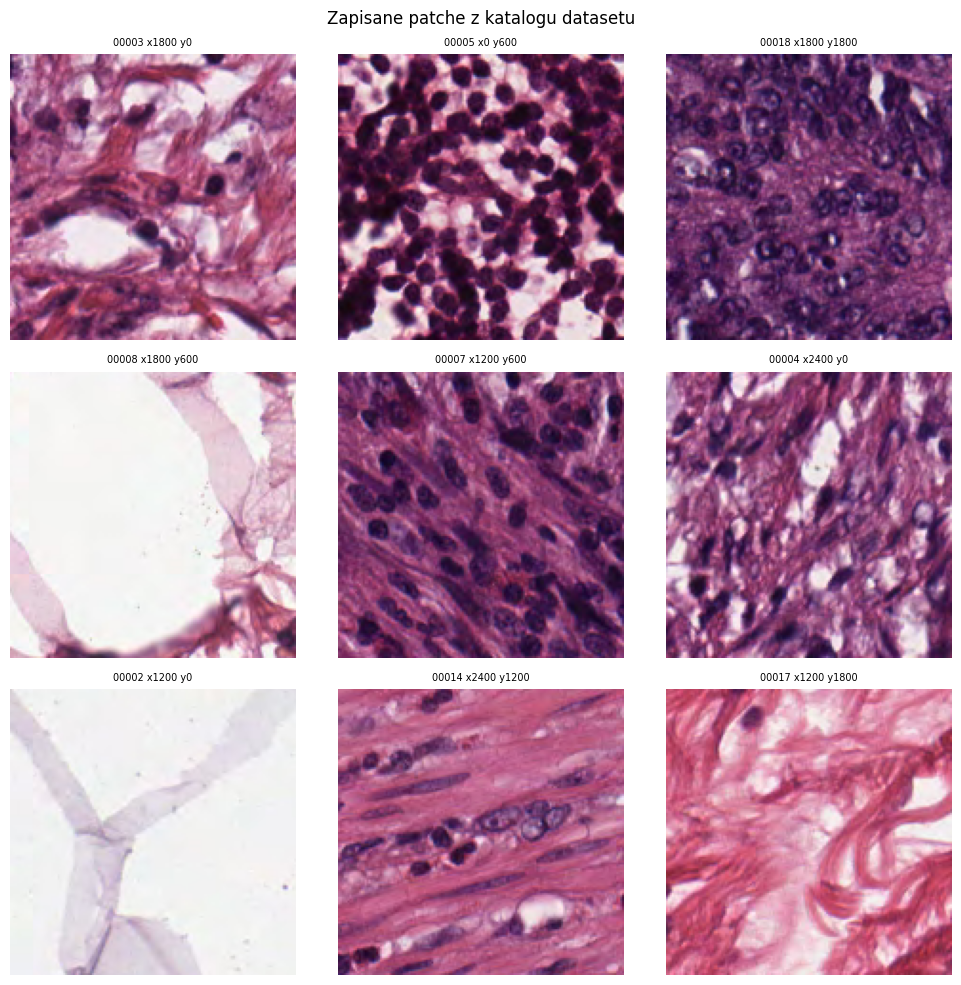

In [21]:
# ── Wizualizacja zapisanych patchy z metadanymi

saved_patches = list((Path(tmp_dir) / "patches" / "kaggle_colorectal").glob("*.png"))[:9]

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for ax, fpath in zip(axes.flat, saved_patches):
    img = np.array(Image.open(fpath))
    ax.imshow(img)
    # Pobierz info z nazwy pliku
    name = fpath.stem
    ax.set_title(name.replace("patch_", "").replace("_", " "), fontsize=7)
    ax.axis("off")

# Jeśli jest mniej niż 9 patchy
for ax in axes.flat[len(saved_patches):]:
    ax.axis("off")

plt.suptitle("Zapisane patche z katalogu datasetu", fontsize=12)
plt.tight_layout()
plt.show()


---
<a id="8"></a>
## 8. Ćwiczenia

### Ćwiczenie 1 — Tissue detection
Zmodyfikuj funkcję `get_tissue_mask_for_patching()` tak, żeby przyjmowała parametr `method` z opcjami `"saturation"`, `"otsu"` i `"combined"` (AND obu masek). Porównaj wyniki na thumbnail.

### Ćwiczenie 2 — Patchowanie z overlapem
Wywołaj `compute_patch_grid()` z `overlap=0.5` i porównaj liczbę uzyskanych patchy z `overlap=0.0`. Narysuj siatkę obu wariantów obok siebie.

### Ćwiczenie 3 — Filtrowanie patchy
Napisz funkcję `filter_patches(df, min_mean=50, max_mean=230, min_std=10)`, która odrzuca:
- zbyt białe patche (prawie samo tło) — `mean > max_mean`
- zbyt ciemne patche (artefakty) — `mean < min_mean`
- jednorodne patche (brak struktury) — `std < min_std`

### Ćwiczenie 4 — Dataset PyTorch
Napisz klasę `WSIPatchDataset(Dataset)` korzystając z metadanych CSV, która:
- wczytuje patche z dysku po ścieżce z kolumny `filename`
- stosuje transformację `torchvision.transforms`
- zwraca `(tensor, label)` gdzie label pochodzi z CSV

```python
from torch.utils.data import Dataset

class WSIPatchDataset(Dataset):
    def __init__(self, csv_path, transform=None):
        # TODO
        pass

    def __len__(self):
        # TODO
        pass

    def __getitem__(self, idx):
        # TODO
        pass
```




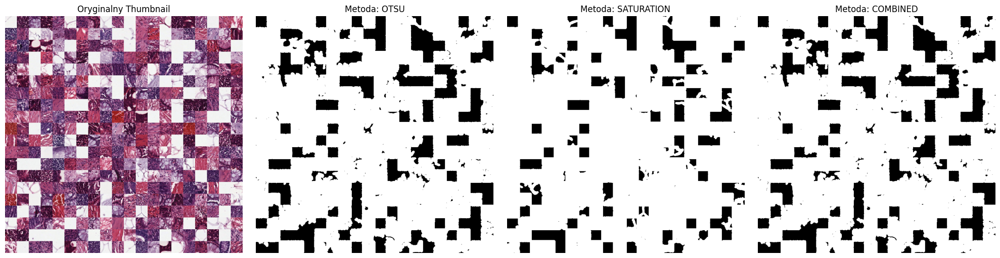

In [22]:
# ĆW 1 — Tissue detection
# zmodyfikuj funkcję `get_tissue_mask_for_patching()` tak, 
# żeby przyjmowała parametr `method` z opcjami `"saturation"`, `"otsu"` i `"combined"` (AND obu masek). 
# Porównaj wyniki na thumbnail.

def get_tissue_mask_for_patching_method(slide, method, level=2, sat_thresh=20, min_size=500):

    # Pobieramy thumbnail na najniższym poziomie
    thumb_size = slide.level_dimensions[level]
    thumb = np.array(slide.get_thumbnail(thumb_size))[:, :, :3]

    gray = cv2.cvtColor(thumb, cv2.COLOR_RGB2GRAY)
    hsv = cv2.cvtColor(thumb, cv2.COLOR_RGB2HSV)
    thresh_otsu = threshold_otsu(gray)
    saturation = hsv[:, :, 1]

    if method == "otsu":
        mask = gray < thresh_otsu
    elif method == "saturation":
        mask = saturation > 20
    elif method == "combined":
        mask_otsu = gray < thresh_otsu
        mask_sat = saturation > 20

        mask = np.logical_and(mask_otsu, mask_sat)

    mask = remove_small_objects(mask, min_size=min_size)
    mask = binary_dilation(mask, disk(3))
    return mask, thumb

methods = ["otsu", "saturation", "combined"]
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

thumb_size = slide.level_dimensions[2]
thumb_rgb = np.array(slide.get_thumbnail(thumb_size))[:, :, :3]
axes[0].imshow(thumb_rgb)
axes[0].set_title("Oryginalny Thumbnail")
axes[0].axis("off")

for i, method in enumerate(methods):
    mask, _ = get_tissue_mask_for_patching_method(slide, method=method, level=2)
    
    axes[i+1].imshow(mask, cmap="gray")
    axes[i+1].set_title(f"Metoda: {method.upper()}")
    axes[i+1].axis("off")

plt.tight_layout()
plt.savefig("cw1_compar")
plt.show()



In [23]:
# ĆW 2 — patchowanie z overlapem
# wywołaj `compute_patch_grid()` z `overlap=0.5`, 
# porównaj liczbę uzyskanych patchy z `overlap=0.0`. 
# narysuj siatkę obu wariantów obok siebie.

# orginalne —— overlap=0.0
coords_0, info_0 = compute_patch_grid(slide, patch_size=150, level=2,
                                   overlap=0.0, tissue_thresh=0.4)

print("WYNIKI PATCHOWANIA (overlap=0.0)")
for k, v in info_0.items():
    if isinstance(v, float):
        print(f"{k}: {v:.2%}")
    else:
        print(f"{k}: {v}")
print(f"\npierwsze 5 koordynatów (x0, y0) w level 0:")
for c in coords_0[:5]:
    print(f"  {c}")

# modyfikacja —— overlap=0.5
coords_05, info_05 = compute_patch_grid(slide, patch_size=150, level=2,
                                   overlap=0.5, tissue_thresh=0.4)

print("WYNIKI PATCHOWANIA (overlap=0.5)")
for k, v in info_05.items():
    if isinstance(v, float):
        print(f"{k}: {v:.2%}")
    else:
        print(f"{k}: {v}")
print(f"\npierwsze 5 koordynatów (x0, y0) w level 0:")
for c in coords_05[:5]:
    print(f"  {c}")



WYNIKI PATCHOWANIA (overlap=0.0)
total_grid_positions: 25
tissue_patches: 25
tissue_fraction: 100.00%
patch_size: 150
level: 2

pierwsze 5 koordynatów (x0, y0) w level 0:
  (0, 0)
  (600, 0)
  (1200, 0)
  (1800, 0)
  (2400, 0)
WYNIKI PATCHOWANIA (overlap=0.5)
total_grid_positions: 81
tissue_patches: 81
tissue_fraction: 100.00%
patch_size: 150
level: 2

pierwsze 5 koordynatów (x0, y0) w level 0:
  (0, 0)
  (300, 0)
  (600, 0)
  (900, 0)
  (1200, 0)


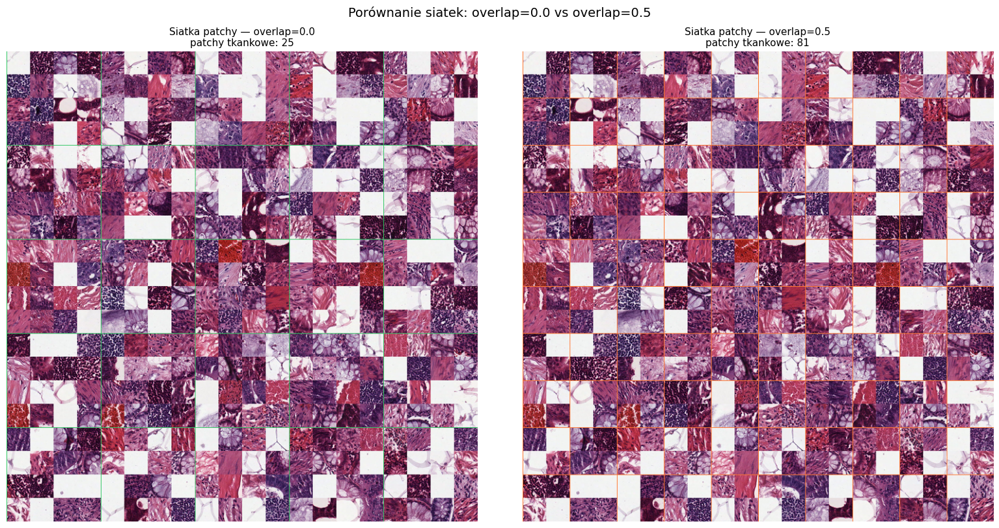

Różnica liczby patchy: 56  (81 vs 25)


In [32]:
# ĆW 2 —— narysuj siatkę obu wariantów obok siebie.
# ── Wizualizacja siatki patchy na thumbnail

# ĆW 2 — narysuj siatkę obu wariantów obok siebie

mask, thumb = get_tissue_mask_for_patching(slide, level=2)
thumb_h, thumb_w = thumb.shape[:2]
W0, H0 = slide.level_dimensions[0]
ds_patch_level = slide.level_downsamples[2]

# Rozmiar patcha w pikselach thumbnailа
pw_t = max(2, int(150 * ds_patch_level / W0 * thumb_w))
ph_t = max(2, int(150 * ds_patch_level / H0 * thumb_h))

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

for ax, coords, info, overlap_label, color in [
    (axes[0], coords_0,  info_0,  "overlap=0.0", (50, 200, 100)),
    (axes[1], coords_05, info_05, "overlap=0.5", (255, 120,  50)),
]:
    img_grid = thumb.copy()

    for x0, y0 in coords[:500]:          # max 500 patchy dla czytelności
        xt = int(x0 / W0 * thumb_w)
        yt = int(y0 / H0 * thumb_h)
        cv2.rectangle(img_grid,
                      (xt, yt),
                      (xt + pw_t, yt + ph_t),
                      color, 1)

    n = info['tissue_patches']
    ax.imshow(img_grid)
    ax.set_title(f"Siatka patchy — {overlap_label}\n"
                 f"patchy tkankowe: {n}",
                 fontsize=11)
    ax.axis("off")

plt.suptitle("Porównanie siatek: overlap=0.0 vs overlap=0.5", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

print(f"Różnica liczby patchy: {info_05['tissue_patches'] - info_0['tissue_patches']}"
      f"  ({info_05['tissue_patches']} vs {info_0['tissue_patches']})")

In [ ]:
# ĆW 3 — filtrowanie patchy
# napisz funkcję `filter_patches(df, min_mean=50, max_mean=230, min_std=10)`, 
# która odrzuca:
    # zbyt białe patche (prawie samo tło) — `mean > max_mean`
    # zbyt ciemne patche (artefakty) — `mean < min_mean`
    # jednorodne patche (brak struktury) — `std < min_std`

def filter_patches(df, min_mean=50, max_mean=230, min_std=10):
    mask_fltr = (df["mean"] > max_mean) and (df["mean"] < min_mean) and (df["std"] < min_std)
    return df[mask_fltr]

In [31]:
# ĆW 4 — Dataset PyTorch
# napisz klasę `WSIPatchDataset(Dataset)` korzystając z metadanych CSV, która:
    # wczytuje patche z dysku po ścieżce z kolumny `filename`
    # stosuje transformację `torchvision.transforms`
    # zwraca `(tensor, label)` gdzie label pochodzi z CSV


class WSIPatchDataset(Dataset):
    def __init__(self, csv_path, transform=None):
        self.df = pd.read_csv(csv_path)
        self.transform = transform
        
        if 'label' not in self.df.columns:
            self.df['label'] = self.df['slide_id'].astype('category').cat.codes

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = row['filename']
        label = int(row['label'])
        
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            tensor = self.transform(image)
        else:
            tensor = transforms.ToTensor()(image)
            
        return tensor, label